# 0.0 Importando pacotes

In [ ]:
import warnings # Serve para ignorar mensagens de alerta que aparecem 
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
import pandas as pd 
import seaborn as sns
import numpy as np

import time

import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

from IPython.display import display


from sklearn.metrics import mean_squared_error,classification_report, plot_confusion_matrix, f1_score, roc_curve, roc_auc_score, accuracy_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score,GridSearchCV, validation_curve, learning_curve, train_test_split, KFold, StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder, RobustScaler, MinMaxScaler, StandardScaler
from sklearn.feature_selection import SelectKBest, VarianceThreshold, f_classif, chi2, f_regression
from sklearn.ensemble import IsolationForest
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.impute import SimpleImputer 

from imblearn import FunctionSampler
from imblearn.pipeline import make_pipeline

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA

from datetime import datetime 

from scipy import stats

In [ ]:
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px

In [ ]:
!pip install kneed
from kneed import KneeLocator

In [ ]:
!pip install autofeat

In [ ]:
!pip install tsfresh

In [ ]:
#!pip install -U plotly
pd.options.plotting.backend = 'plotly'

In [ ]:
def graph_roc_curve_multiple(log_fpr_tudo, log_tpr_tudo):
    plt.figure(figsize=(15,8))
    plt.title('Curva ROC', fontsize=18)

    recall = log_tpr / (log_tpr + (1-log_tpr)) 
    precision = log_tpr / (log_tpr + log_fpr)
    precision[np.isnan(precision)]=0

    F1 = 2*(precision*recall)/(precision+recall)
    F1[np.isnan(F1)]=0
    ix = np.argmax(F1)
    print('Melhor Threshold=%f, F1 Score=%.4f' % (log_threshold[ix], F1[ix]))

    plt.scatter(log_fpr[ix],log_tpr[ix], marker='o',s=90,color='black', label='Best F1 score point: {:.4F}'.format(F1[ix]))  


    #############
    # Plotando o ROC
    #############

    plt.plot(log_fpr_tudo, log_tpr_tudo,  marker='.',label='AUC regressão logística: {:.4f}'.format(roc_auc_score(y_test,y_pred_probab_tudo[:,1],average=None)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('Taxa de falso positivo', fontsize=16)
    plt.ylabel('Taxa de verdadeiro positivo', fontsize=16)
    plt.annotate('Score do ROC 50% \n (Valor mínimo - equivalente a chutar 50% das vezes certo)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()

In [ ]:
# Configurações para plotar os dados
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 20,
    'figure.figsize': (25,12)
})

sns.set(rc={'figure.figsize':(25,40)})

# 0.1 Formulação do problema de detecção de anomalia

https://www.youtube.com/watch?v=12Xq9OLdQwQ&feature=emb_title&ab_channel=MicrosoftResearch

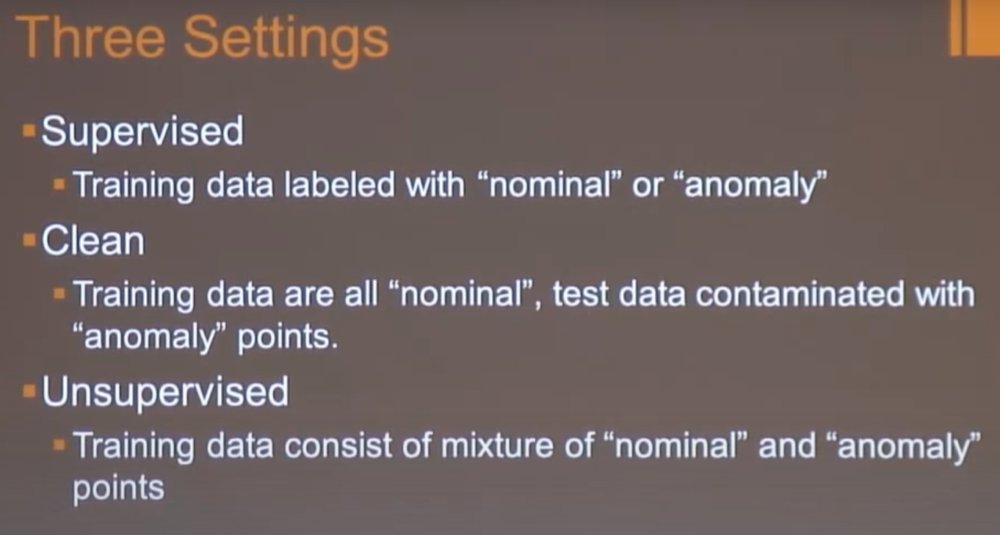

**Supervised:** vc tem um label e as classes estão desbalanceadas 

**Clean:** os dados de treino do modelo não possuem anomalias mas os dados de teste terão dados contaminados para serem detectados (Encoder)

**Unsupervised:** dados de treino estão contaminados com anomalias

Como esse caso temos os labels dos dados, temos um problema de classificação supervisionado


# 1.0 Importando dados

In [ ]:
df = pd.read_csv('/content/sensor.csv') # Importando os dados do arquivo csv

In [ ]:
df['timestamp']=pd.to_datetime(df['timestamp'])

In [ ]:
df.index = df['timestamp']

In [ ]:
df.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,47.52422,31.11716,1.681353,419.5747,NaN,461.8781,466.3284,2.565284,665.3993,398.9862,880.0001,498.8926,975.9409,627.6740,741.7151,848.0708,429.0377,785.1935,684.9443,594.4445,682.8125,680.4416,433.7037,171.9375,341.9039,195.0655,90.32386,40.36458,31.51042,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:01:00,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,47.52422,31.11716,1.681353,419.5747,NaN,461.8781,466.3284,2.565284,665.3993,398.9862,880.0001,498.8926,975.9409,627.6740,741.7151,848.0708,429.0377,785.1935,684.9443,594.4445,682.8125,680.4416,433.7037,171.9375,341.9039,195.0655,90.32386,40.36458,31.51042,70.57291,30.98958,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:02:00,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,37.86777,48.17723,32.08894,1.708474,420.8480,NaN,462.7798,459.6364,2.500062,666.2234,399.9418,880.4237,501.3617,982.7342,631.1326,740.8031,849.8997,454.2390,778.5734,715.6266,661.5740,721.8750,694.7721,441.2635,169.9820,343.1955,200.9694,93.90508,41.40625,31.25000,69.53125,30.46875,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
2018-04-01 00:03:00,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,38.57977,48.65607,31.67221,1.579427,420.7494,NaN,462.8980,460.8858,2.509521,666.0114,399.1046,878.8917,499.0430,977.7520,625.4076,739.2722,847.7579,474.8731,779.5091,690.4011,686.1111,754.6875,683.3831,446.2493,166.4987,343.9586,193.1689,101.04060,41.92708,31.51042,72.13541,30.46875,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
2018-04-01 00:04:00,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,39.48939,49.06298,31.95202,1.683831,419.8926,NaN,461.4906,468.2206,2.604785,663.2111,400.5426,882.5874,498.5383,979.5755,627.1830,737.6033,846.9182,408.8159,785.2307,704.6937,631.4814,766.1458,702.4431,433.9081,164.7498,339.9630,193.8770,101.70380,42.70833,31.51042,76.82291,30.98958,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [ ]:
df.drop('Unnamed: 0',inplace=True,axis=1)
df.drop('timestamp',inplace=True,axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 220320 entries, 2018-04-01 00:00:00 to 2018-08-31 23:59:00
Data columns (total 53 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   sensor_00       210112 non-null  float64
 1   sensor_01       219951 non-null  float64
 2   sensor_02       220301 non-null  float64
 3   sensor_03       220301 non-null  float64
 4   sensor_04       220301 non-null  float64
 5   sensor_05       220301 non-null  float64
 6   sensor_06       215522 non-null  float64
 7   sensor_07       214869 non-null  float64
 8   sensor_08       215213 non-null  float64
 9   sensor_09       215725 non-null  float64
 10  sensor_10       220301 non-null  float64
 11  sensor_11       220301 non-null  float64
 12  sensor_12       220301 non-null  float64
 13  sensor_13       220301 non-null  float64
 14  sensor_14       220299 non-null  float64
 15  sensor_15       0 non-null       float64
 16  sensor_16       220289

In [ ]:
df['machine_status'].value_counts()

NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

Como estamos trabalhando com detecção de anomalia, deveríamos ter 2 classes apenas: anomalia ou não anomalia

Vamos juntar as classes BROKEN e RECOVERING para a nova classe Anomaly

In [ ]:
df=df.replace('BROKEN','ANOMALY')
df=df.replace('RECOVERING','ANOMALY')

In [ ]:
df['machine_status'].value_counts()

NORMAL     205836
ANOMALY     14484
Name: machine_status, dtype: int64

In [ ]:
enc = LabelEncoder()
df['machine_status'] = enc.fit_transform(df['machine_status'])

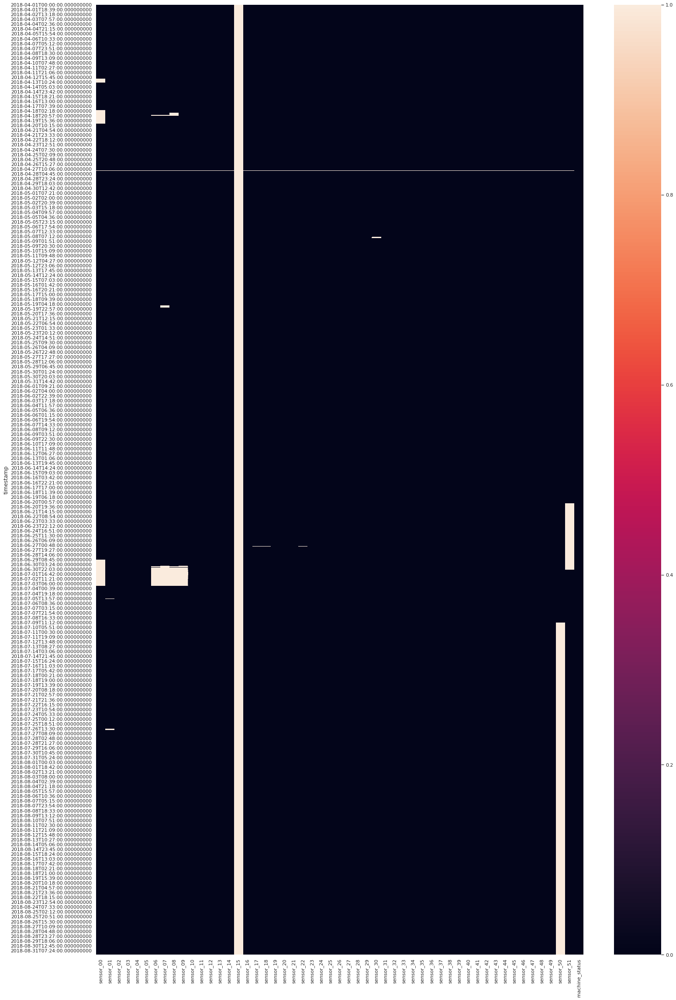

In [ ]:
sns.heatmap(df.isnull())

In [ ]:
df.drop('sensor_15',inplace=True,axis=1)
df.drop('sensor_50',inplace=True,axis=1)
df.drop('sensor_51',inplace=True,axis=1)

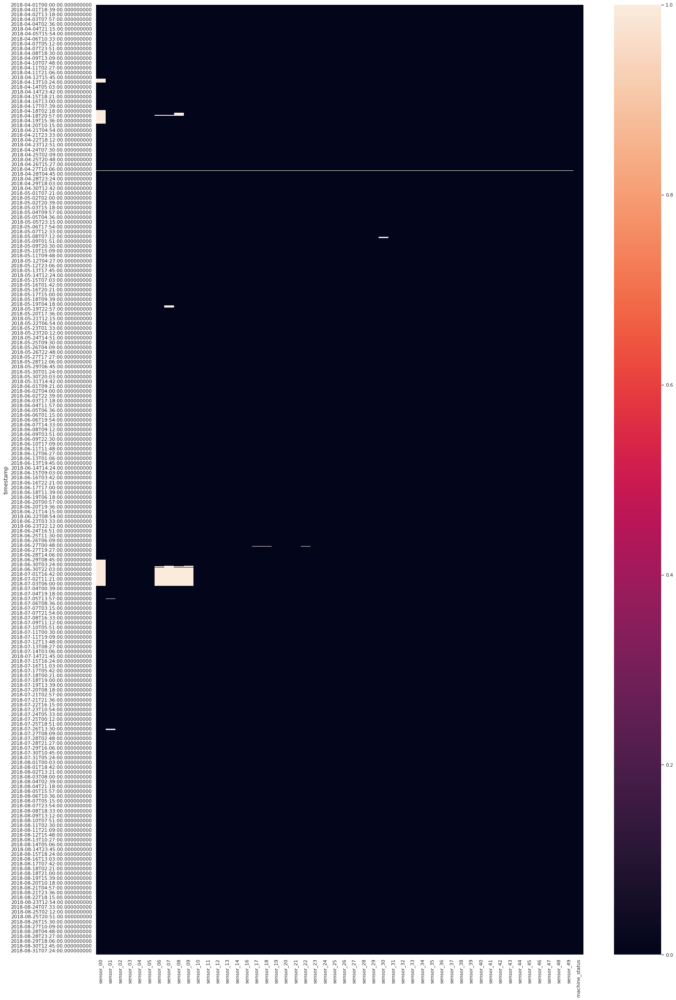

In [ ]:
sns.heatmap(df.isnull())

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 220320 entries, 2018-04-01 00:00:00 to 2018-08-31 23:59:00
Data columns (total 50 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   sensor_00       210112 non-null  float64
 1   sensor_01       219951 non-null  float64
 2   sensor_02       220301 non-null  float64
 3   sensor_03       220301 non-null  float64
 4   sensor_04       220301 non-null  float64
 5   sensor_05       220301 non-null  float64
 6   sensor_06       215522 non-null  float64
 7   sensor_07       214869 non-null  float64
 8   sensor_08       215213 non-null  float64
 9   sensor_09       215725 non-null  float64
 10  sensor_10       220301 non-null  float64
 11  sensor_11       220301 non-null  float64
 12  sensor_12       220301 non-null  float64
 13  sensor_13       220301 non-null  float64
 14  sensor_14       220299 non-null  float64
 15  sensor_16       220289 non-null  float64
 16  sensor_17       220274

In [ ]:
df_copy = df.copy() # Variavel utilizada para visualizar os dados

In [ ]:
df_copy = df_copy.interpolate(method='linear', axis=1).ffill().bfill()

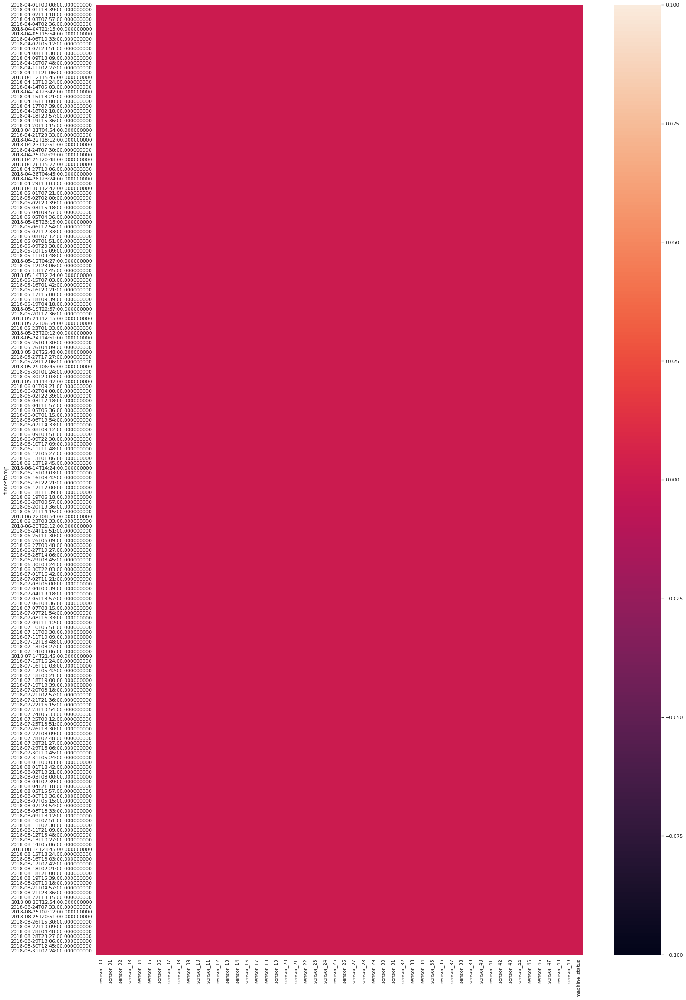

In [ ]:
sns.heatmap(df_copy.isnull())

In [ ]:
df_copy['machine_status']=df_copy['machine_status'].astype(int)

In [ ]:
df_copy['machine_status'].value_counts()

1    205836
0     14484
Name: machine_status, dtype: int64

# 2.0 Visualização dos dados

### 2.1 Distribuição dos dados

In [ ]:
df_normal=df_copy[df_copy['machine_status'] == 1]
df_anomaly=df_copy[df_copy['machine_status'] == 0]

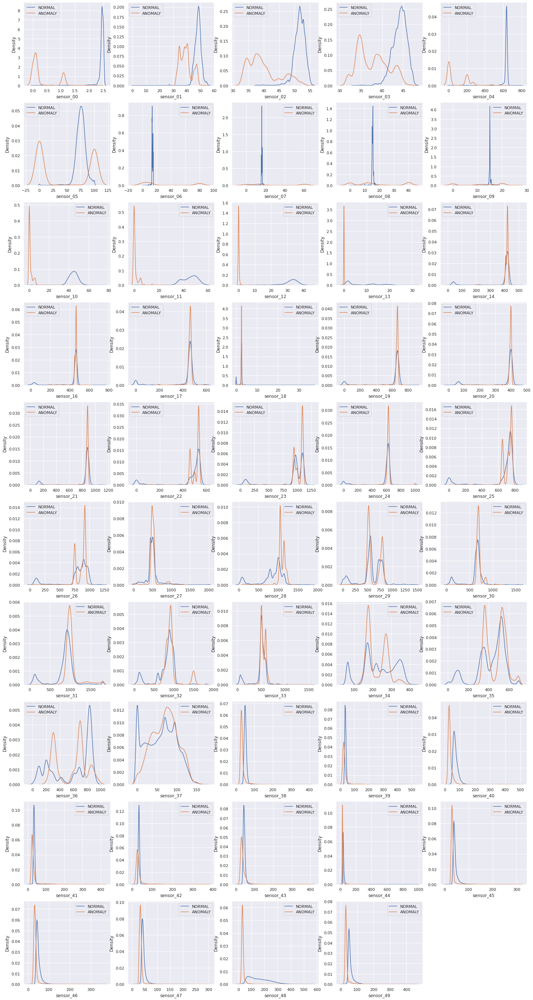

In [ ]:
plt.rcParams.update({
    'figure.figsize': (25,50)
})

for i in range(49):
  plt.subplot(10,5,i+1)
  
  sns.distplot(df_normal[df_normal.columns[i]], label='NORMAL',hist=False)
  sns.distplot(df_anomaly[df_anomaly.columns[i]], label='ANOMALY',hist=False)

  plt.legend()

Bem dificil distinguir entre as classes, ainda mais por causa da grande quantidade de outliers que vem de um problema de detecção de anomalia. Nao podemos tirar outliers justamente por causa da definição do problema

## 2.2 Localização dos eventos de falha

Sensores que possuem comportamentos estranhos no mesmo local que falhou:

In [ ]:
normal_idx = df_copy.loc[df_copy['machine_status'] == 1].index
anomaly_idx = df_copy.loc[df_copy['machine_status'] == 0].index

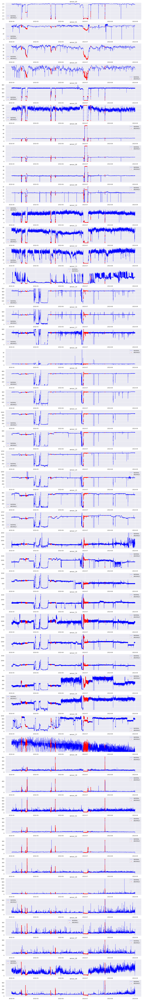

In [ ]:
plt.rcParams.update({
    'figure.figsize': (20,150)
})

for i in range(49):
  plt.subplot(49,1,i+1)
  
  plt.plot(df_copy.loc[:,df_copy.columns[i]],color='blue',label='NORMAL',linewidth=0.7)
  plt.plot(df_copy.loc[list(anomaly_idx),df_copy.columns[i]],linestyle='none',marker='X',color='red',markersize=2,label='ANOMALY')

  plt.title(df_copy.columns[i])
  plt.legend()

Visualmente, os sensores que possuem anomalias fáceis de serem percebidos são:
- 00
- 04
- 05
- 06
- 07
- 08
- 10
- 11
- 12

Isso pode ser confirmado ao olhar os histogramas dos dados. Pelos histogramas, os sensores 01,02 e 03 também seriam bons


## 2.3 Correlação entre sensores

O objetivo de visualizar a correlação entre os sensores é verificar informação redundante. 

Como a variável objetiva é categórica e as independentes numéricas, não existe muito sentido em analisar a relação (apesar de ser possível).

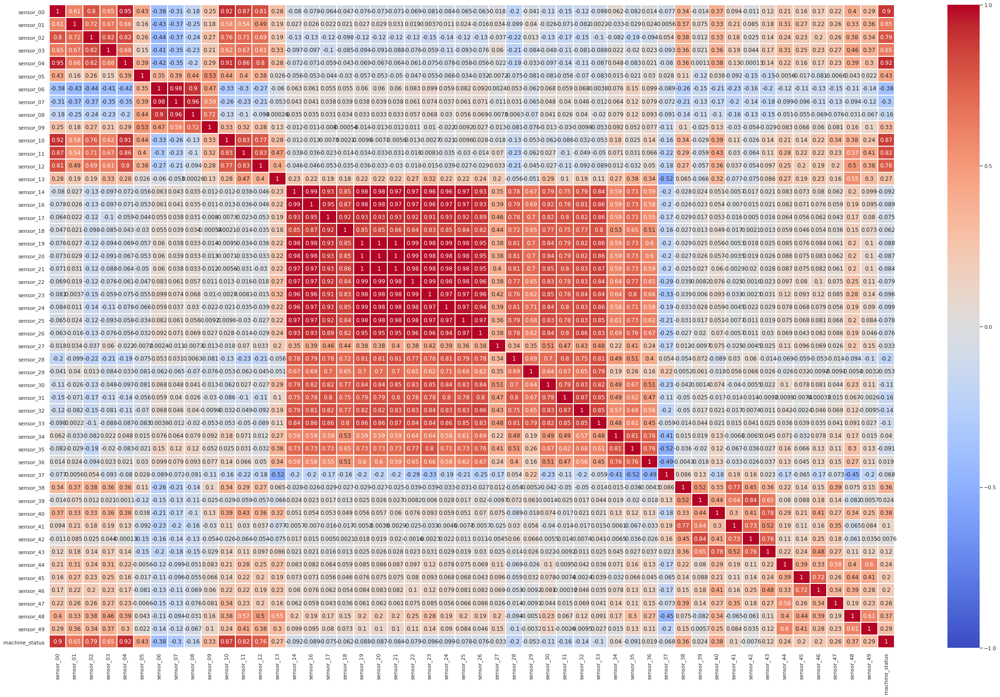

In [ ]:
plt.rcParams.update({
    'figure.figsize': (40,25)
})

df_corr = pd.DataFrame(df_copy.corr(method='pearson'))
sns.heatmap(df_corr, cmap="coolwarm", linewidths=1,annot=True,vmin = -1.0 , vmax=1.0, cbar_kws={"ticks":[-1,-0.5,0,0.5,1]}) 

MUITOS sensores possuem informação redundante. Teremos que eliminar eles depois

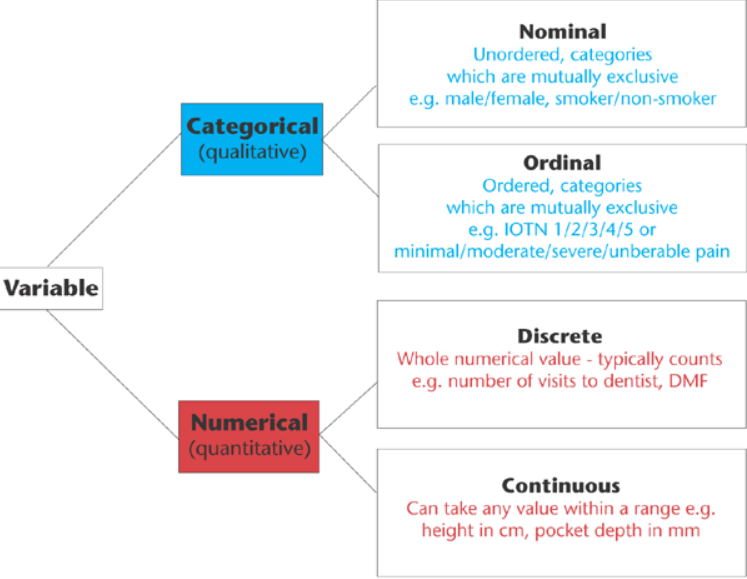

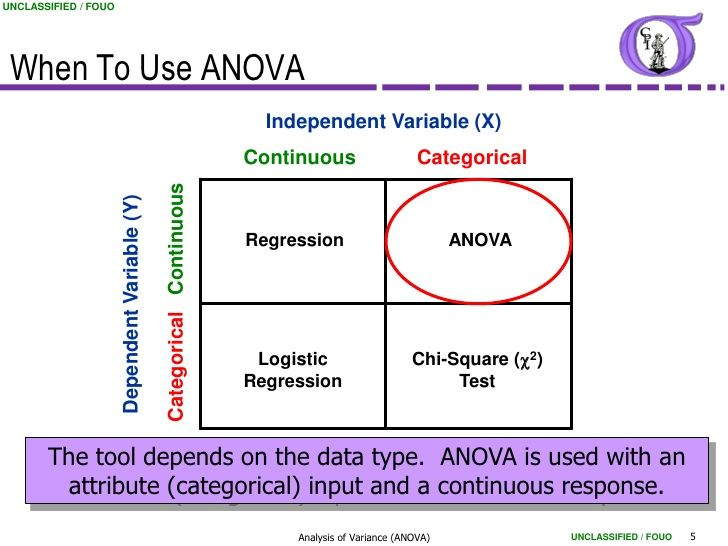

Continuous vs binary variable

- **Correlation ratio (eta):** Mathematically, it is defined as the weighted variance of the mean of each category divided by the variance of all samples; in human language, the Correlation Ratio answers the following question: Given a continuous number, how well can you know to which category it belongs to?

In statistics, the correlation ratio is a measure of the relationship between the statistical dispersion within individual categories and the dispersion across the whole population or sample. The measure is defined as the ratio of two standard deviations representing these types of variation


- **Biserial correlation:** The point biserial correlation coefficient is the same as the Pearson correlation coefficient used in linear regression. The only difference is we are comparing dichotomous data to continuous data instead of continuous data to continuous data. 



https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9 

https://towardsdatascience.com/point-biserial-correlation-with-python-f7cd591bd3b1 

https://www.statology.org/point-biserial-correlation-python/ 

## 2.3.1 Correlação biserial

Features must be mutually exclusive (male/female)

Eu acho que anomalia e não anomalia é mutualmente exclusivo

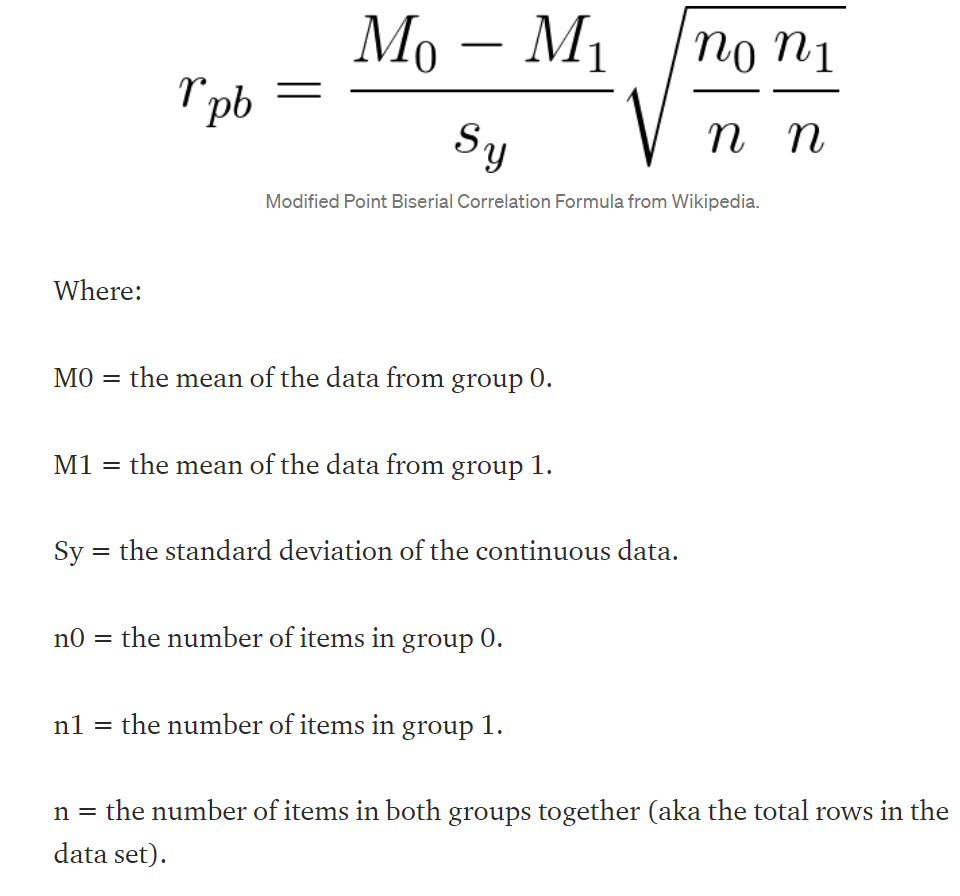

Hipótese nula: a correlação é igual a zero

Se o p-value for menor que 0.05, rejeitamos a hipótese nula e afirmamos que existe uma correlação

Assume distribuição normal da variável objetiva

In [ ]:
from scipy.stats import pointbiserialr

In [ ]:
y = df_copy['machine_status']
X = df_copy.drop('machine_status',axis=1)

In [ ]:
X.columns

Index(['sensor_00', 'sensor_01', 'sensor_02', 'sensor_03', 'sensor_04',
       'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09',
       'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14',
       'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20',
       'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25',
       'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30',
       'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34', 'sensor_35',
       'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39', 'sensor_40',
       'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44', 'sensor_45',
       'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49'],
      dtype='object')

In [ ]:
for column in X.columns:
  pbc = pointbiserialr(X[column], y)
  print(column)
  print(pbc)
  print()

sensor_00
PointbiserialrResult(correlation=0.8971648069273442, pvalue=0.0)

sensor_01
PointbiserialrResult(correlation=0.6524499635594845, pvalue=0.0)

sensor_02
PointbiserialrResult(correlation=0.7913395278979654, pvalue=0.0)

sensor_03
PointbiserialrResult(correlation=0.6462369319251952, pvalue=0.0)

sensor_04
PointbiserialrResult(correlation=0.9162510199777909, pvalue=0.0)

sensor_05
PointbiserialrResult(correlation=0.43467419852346856, pvalue=0.0)

sensor_06
PointbiserialrResult(correlation=-0.38149428693145737, pvalue=0.0)

sensor_07
PointbiserialrResult(correlation=-0.3011982323090856, pvalue=0.0)

sensor_08
PointbiserialrResult(correlation=-0.15576409899169702, pvalue=0.0)

sensor_09
PointbiserialrResult(correlation=0.32502196465356925, pvalue=0.0)

sensor_10
PointbiserialrResult(correlation=0.8725257229937387, pvalue=0.0)

sensor_11
PointbiserialrResult(correlation=0.8234951785688267, pvalue=0.0)

sensor_12
PointbiserialrResult(correlation=0.7587853463326891, pvalue=0.0)

senso

**Conclusão:** O coeficiente de Pearson lida com o caso de variável categórica binária!

## 2.3.2 Correlation ratio

https://www.statisticssolutions.com/directory-of-statistical-analyses-correlation-ratio/

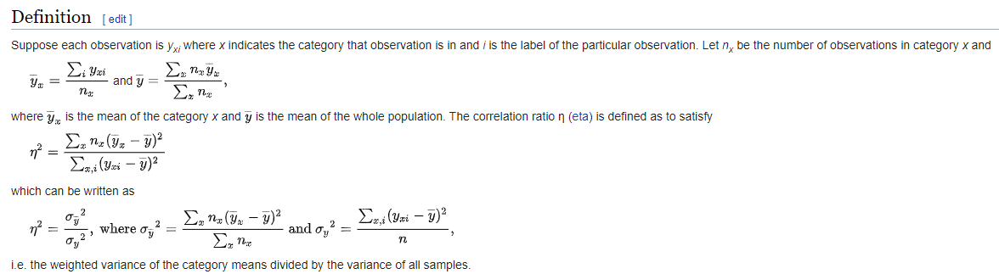

If the relationship between values of ${\displaystyle x}$ and values of ${\displaystyle {\overline {y}}_{x}}\$ is linear (which is certainly true when there are only two possibilities for x) this will give the same result as the square of Pearson's correlation coefficient; otherwise the correlation ratio will be larger in magnitude. It can therefore be used for judging non-linear relationships.

The correlation ratio ${\displaystyle \eta }$  takes values between 0 and 1. The limit ${\displaystyle \eta =0}$ represents the special case of no dispersion among the means of the different categories, while ${\displaystyle \eta =1}$ refers to no dispersion within the individual categories. ${\displaystyle \eta }$ is undefined when all data points of the complete population take the same value.

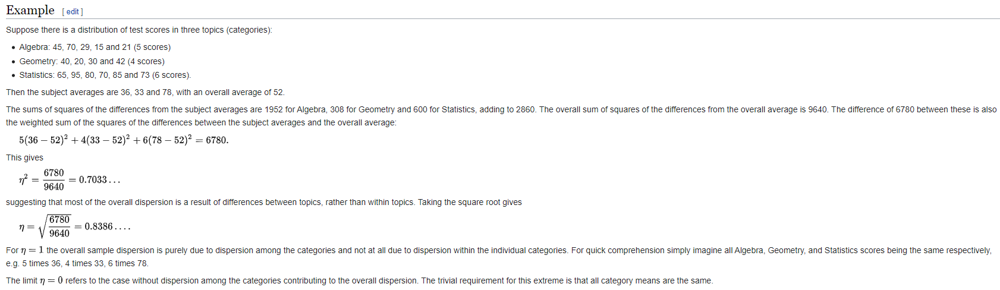

In [ ]:
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat)+1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0,cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

In [ ]:
for column in X.columns:
  eta = correlation_ratio(y, X[column])
  print(column)
  print(eta)
  print()

sensor_00
0.8971648069273398

sensor_01
0.652449963559489

sensor_02
0.7913395278979641

sensor_03
0.646236931925153

sensor_04
0.9162510199777886

sensor_05
0.43467419852347017

sensor_06
0.3814942869314627

sensor_07
0.3011982323090648

sensor_08
0.15576409899167384

sensor_09
0.32502196465355254

sensor_10
0.8725257229937382

sensor_11
0.823495178568828

sensor_12
0.7587853463326887

sensor_13
0.26984360945135544

sensor_14
0.0916924586332452

sensor_16
0.08918061372287492

sensor_17
0.07469503504731495

sensor_18
0.06150820500884313

sensor_19
0.08813043993404517

sensor_20
0.08702736185760375

sensor_21
0.08443494116709997

sensor_22
0.07946136375160837

sensor_23
0.09561723133925898

sensor_24
0.09880049415537066

sensor_25
0.07819458074921345

sensor_26
0.07601013311010822

sensor_27
0.03257990267077738

sensor_28
0.20330132262032638

sensor_29
0.053202876663839306

sensor_30
0.11473105031343726

sensor_31
0.15850279584719168

sensor_32
0.13637185746292435

sensor_33
0.104585302

# 3.0 Baseline model

In [ ]:
y = df_copy['machine_status']
X = df_copy.drop('machine_status',axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
folds = StratifiedShuffleSplit(n_splits=2, random_state=1) 

In [ ]:
%%time
log_regression_base = LogisticRegression(random_state=1,solver='liblinear',penalty="l1",max_iter=1000) 

cv_results = cross_val_score(log_regression_base, X_train, y_train, cv=folds, scoring='f1')

log_fitado = log_regression_base.fit(X_train,y_train)
y_predito_base = log_fitado.predict(X_test)

score_base = cv_results.mean()
print("F1 da validação cruzada do modelo base: ", score_base)

F1 da validação cruzada do modelo base:  0.990334185182259
CPU times: user 4min 26s, sys: 233 ms, total: 4min 26s
Wall time: 4min 26s


In [ ]:
print(classification_report(y_test,y_predito_base))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2937
           1       1.00      1.00      1.00     41127

    accuracy                           1.00     44064
   macro avg       0.99      0.99      0.99     44064
weighted avg       1.00      1.00      1.00     44064



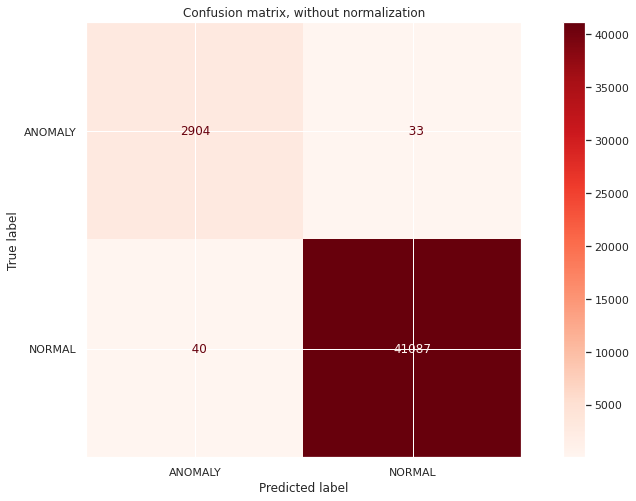

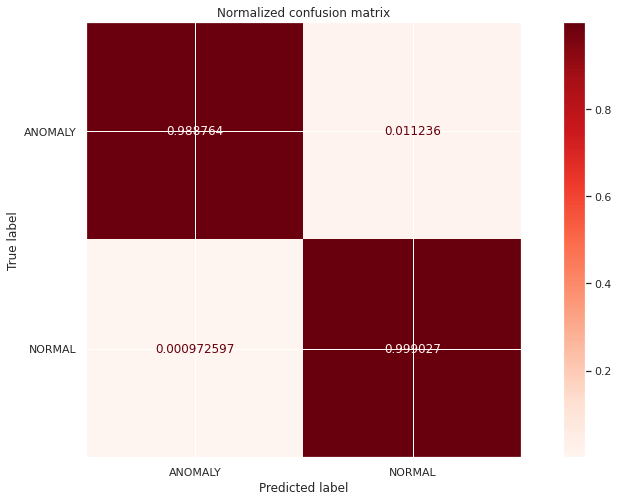

In [ ]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(log_regression_base, X_test, y_test,
                                 display_labels=['ANOMALY','NORMAL'],
                                 cmap=plt.cm.Reds,
                                 normalize=normalize,
                                 values_format='4g')
    disp.ax_.set_title(title)
    plt.gcf().set_size_inches(15,8)

plt.show()

## 3.1 Variaveis mais importantes do modelo

In [ ]:
from sklearn.feature_selection import SelectFromModel

In [ ]:
model = SelectFromModel(log_regression_base, prefit=True)

X_new = model.transform(X)
X_new

array([[  2.465394  ,  47.09201   ,  53.2118    , ...,  38.19444   ,
        157.9861    ,  67.70834   ],
       [  2.465394  ,  47.09201   ,  53.2118    , ...,  38.19444   ,
        157.9861    ,  67.70834   ],
       [  2.444734  ,  47.35243   ,  53.2118    , ...,  38.19444275,
        155.9606    ,  67.12963   ],
       ...,
       [  2.396528  ,  47.69964981,  50.52083   , ...,  40.79861   ,
        217.3032    , 155.3819    ],
       [  2.406366  ,  47.69964981,  50.52083206, ...,  40.50925827,
        222.5116    , 153.9352    ],
       [  2.396528  ,  47.69964981,  50.52083206, ...,  40.21991   ,
        227.4306    , 150.463     ]])

In [ ]:
selected_features = pd.DataFrame(model.inverse_transform(X_new), 
                                 index=X.index,
                                 columns=X.columns)
selected_features

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,0.0,16.13136,15.56713,15.05353,37.22740,47.52422,31.11716,1.681353,419.5747,461.8781,0.0,0.0,665.3993,0.0,0.0,498.8926,975.9409,627.6740,741.7151,848.0708,429.0377,785.1935,684.9443,594.4445,682.8125,0.0,433.7037,171.9375,341.9039,195.0655,90.32386,40.36458,31.51042,70.57291,30.989580,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,0.0,16.13136,15.56713,15.05353,37.22740,47.52422,31.11716,1.681353,419.5747,461.8781,0.0,0.0,665.3993,0.0,0.0,498.8926,975.9409,627.6740,741.7151,848.0708,429.0377,785.1935,684.9443,594.4445,682.8125,0.0,433.7037,171.9375,341.9039,195.0655,90.32386,40.36458,31.51042,70.57291,30.989580,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,0.0,16.03733,15.61777,15.01013,37.86777,48.17723,32.08894,1.708474,420.8480,462.7798,0.0,0.0,666.2234,0.0,0.0,501.3617,982.7342,631.1326,740.8031,849.8997,454.2390,778.5734,715.6266,661.5740,721.8750,0.0,441.2635,169.9820,343.1955,200.9694,93.90508,41.40625,31.25000,69.53125,30.468750,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,0.0,16.24711,15.69734,15.08247,38.57977,48.65607,31.67221,1.579427,420.7494,462.8980,0.0,0.0,666.0114,0.0,0.0,499.0430,977.7520,625.4076,739.2722,847.7579,474.8731,779.5091,690.4011,686.1111,754.6875,0.0,446.2493,166.4987,343.9586,193.1689,101.04060,41.92708,31.51042,72.13541,30.468750,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,0.0,16.21094,15.69734,15.08247,39.48939,49.06298,31.95202,1.683831,419.8926,461.4906,0.0,0.0,663.2111,0.0,0.0,498.5383,979.5755,627.1830,737.6033,846.9182,408.8159,785.2307,704.6937,631.4814,766.1458,0.0,433.9081,164.7498,339.9630,193.8770,101.70380,42.70833,31.51042,76.82291,30.989580,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,0.0,16.65220,15.65393,15.16204,43.17085,54.16052,38.05424,13.265320,420.7993,463.2318,0.0,0.0,676.6655,0.0,0.0,543.5801,1109.5010,611.1745,700.5885,796.5964,692.1138,779.2067,485.0358,691.6666,974.9999,0.0,477.3156,266.0334,578.5221,817.5707,0.00000,47.13541,29.16667,71.61458,30.468750,30.208330,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,0.0,16.70284,15.65393,15.11863,43.21038,54.52602,38.53485,13.242270,422.1567,463.1928,0.0,0.0,676.6547,0.0,0.0,541.7014,1106.3710,609.4917,698.4915,800.1906,697.8002,797.5571,510.9510,672.2222,927.0833,0.0,487.8679,262.2222,568.1035,807.0151,0.00000,46.87500,28.90625,73.17708,30.208332,29.947920,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,0.0,16.70284,15.69734,15.11863,43.12836,55.11779,38.52678,13.188660,420.2166,462.4065,0.0,0.0

In [ ]:
bad_columns = selected_features.columns[selected_features.var() == 0]

In [ ]:
bad_columns

Index(['sensor_06', 'sensor_17', 'sensor_18', 'sensor_20', 'sensor_21',
       'sensor_32'],
      dtype='object')

# 4.0 Removendo variáveis irrelevantes

In [ ]:
# Create correlation matrix
corr_matrix = X.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.80
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]
to_drop

['sensor_03',
 'sensor_04',
 'sensor_07',
 'sensor_08',
 'sensor_10',
 'sensor_11',
 'sensor_12',
 'sensor_16',
 'sensor_17',
 'sensor_18',
 'sensor_19',
 'sensor_20',
 'sensor_21',
 'sensor_22',
 'sensor_23',
 'sensor_24',
 'sensor_25',
 'sensor_26',
 'sensor_28',
 'sensor_30',
 'sensor_31',
 'sensor_32',
 'sensor_33',
 'sensor_35',
 'sensor_42']

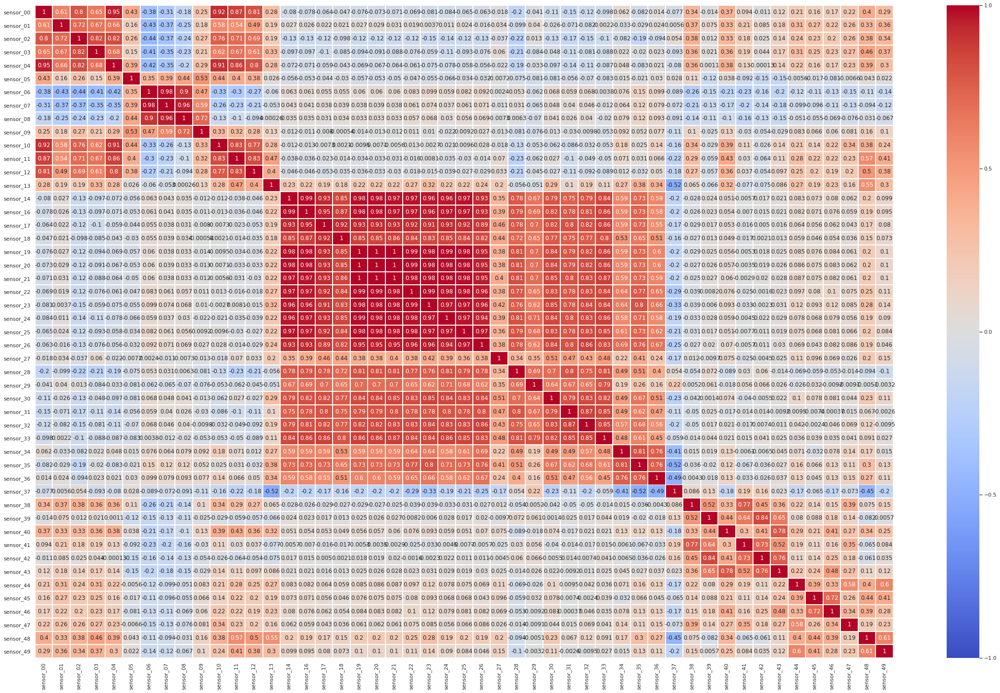

In [ ]:
plt.rcParams.update({
    'figure.figsize': (40,25)
})

df_corr = pd.DataFrame(X.corr(method='pearson'))
sns.heatmap(df_corr, cmap="coolwarm", linewidths=1,annot=True,vmin = -1.0 , vmax=1.0, cbar_kws={"ticks":[-1,-0.5,0,0.5,1]}) 

In [ ]:
X_dropado_2 = X.drop(to_drop, axis=1)
X_dropado_2

,sensor_00,sensor_01,sensor_02,sensor_05,sensor_06,sensor_09,sensor_13,sensor_14,sensor_27,sensor_29,sensor_34,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
timestamp,,,,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,76.45975,13.41146,15.05353,1.681353,419.5747,429.0377,684.9443,171.9375,195.0655,90.32386,40.36458,31.51042,70.57291,30.989580,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2018-04-01 00:01:00,2.465394,47.09201,53.211800,76.45975,13.41146,15.05353,1.681353,419.5747,429.0377,684.9443,171.9375,195.0655,90.32386,40.36458,31.51042,70.57291,30.989580,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834
2018-04-01 00:02:00,2.444734,47.35243,53.211800,73.54598,13.32465,15.01013,1.708474,420.8480,454.2390,715.6266,169.9820,200.9694,93.90508,41.40625,31.25000,69.53125,30.468750,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963
2018-04-01 00:03:00,2.460474,47.09201,53.168400,76.98898,13.31742,15.08247,1.579427,420.7494,474.8731,690.4011,166.4987,193.1689,101.04060,41.92708,31.51042,72.13541,30.468750,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028
2018-04-01 00:04:00,2.445718,47.13541,53.211800,76.58897,13.35359,15.08247,1.683831,419.8926,408.8159,704.6937,164.7498,193.8770,101.70380,42.70833,31.51042,76.82291,30.989580,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,64.59095,15.11863,15.16204,13.265320,420.7993,692.1138,485.0358,266.0334,817.5707,0.00000,47.13541,29.16667,71.61458,30.468750,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580
2018-08-31 23:56:00,2.400463,47.69965,50.564240,65.83363,15.15480,15.11863,13.242270,422.1567,697.8002,510.9510,262.2222,807.0151,0.00000,46.87500,28.90625,73.17708,30.208332,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000
2018-08-31 23:57:00,2.396528,47.69965,50.520830,67.29445,15.08970,15.11863,13.188660,420.2166,704.6601,492.7720,260.8372,805.5605,0.00000,46.09375,28.64583,77.08333,29.947920,39.06250,65.393520,48.90046,48.03241,40.798610,217.3032,155.38190


Treinando o modelo

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_dropado_2, y, test_size=0.2, random_state=1)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
%%time
log_regression_base = LogisticRegression(random_state=1,solver='liblinear',penalty='l1',max_iter=1000) 

cv_results = cross_val_score(log_regression_base, X_train, y_train, cv=folds, scoring='f1')

log_fitado = log_regression_base.fit(X_train,y_train)
y_predito_base = log_fitado.predict(X_test)

score_base = cv_results.mean()
print("F1 da validação cruzada do modelo base: ", score_base)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



F1 da validação cruzada do modelo base:  0.990334185182259
CPU times: user 4min 9s, sys: 251 ms, total: 4min 9s
Wall time: 4min 9s


/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [ ]:
print(classification_report(y_test,y_predito_base))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      2937
           1       1.00      1.00      1.00     41127

    accuracy                           1.00     44064
   macro avg       0.97      0.99      0.98     44064
weighted avg       1.00      1.00      1.00     44064



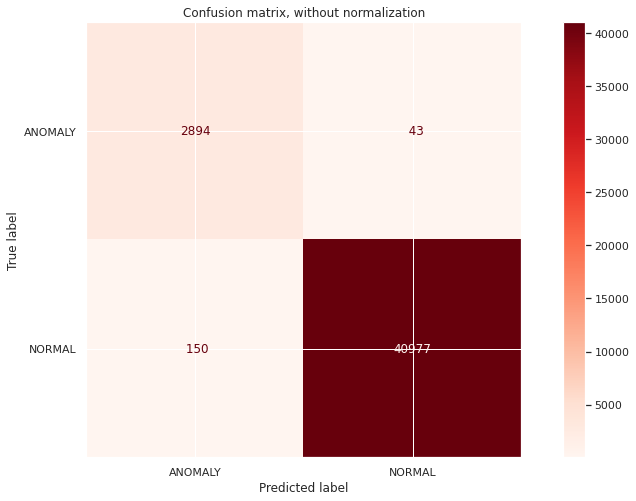

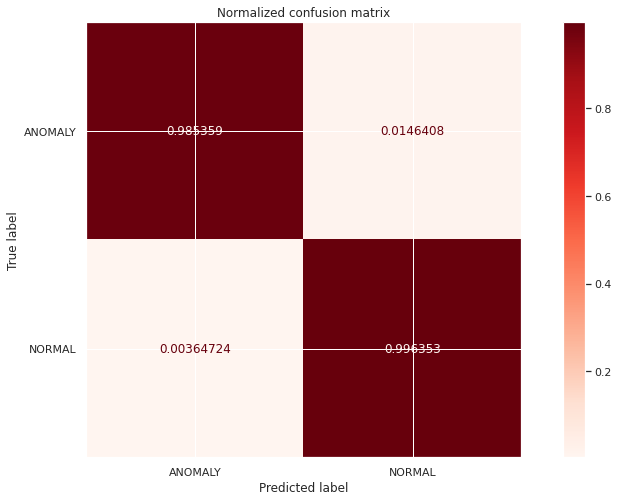

In [ ]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(log_regression_base, X_test, y_test,
                                 display_labels=['ANOMALY','NORMAL'],
                                 cmap=plt.cm.Reds,
                                 normalize=normalize,
                                 values_format='4g')
    disp.ax_.set_title(title)
    plt.gcf().set_size_inches(15,8)

plt.show()

Diminuiu a acurácia de prever casos de anomalia e aumentou o número de falsos positivos. 

Mesmo assim, considero que a performance é bem parecida

# Downsampling

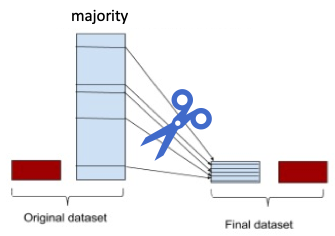

Devido a quantidade de dados que temos (220000 dados) os algoritmos de seleção de features automatico demoram 3h para uma única iteração.

Decidiu-se então descartar por completa a informação temporal dos dados **mas não o significado das variáveis (nao vou usar PCA)**. 

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

“NearMiss-1” selects samples of the majority class that their average distances to three closest instances of the minority class are the smallest. “NearMiss-2” uses three farthest samples of the minority class. “NearMiss-3” selects a given number of the closest samples of the majority class for each sample of the minority class

In [ ]:
us = NearMiss(version=1, n_neighbors=3,random_state=1)
Xnear_miss, Ynear_miss = us.fit_resample(X, y)

In [ ]:
Xnear_miss_2 = pd.DataFrame(Xnear_miss,columns=X.columns)
Xnear_miss_2

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
0,0.000000,53.34201,52.821180,43.402775,202.526031,49.79289,3.219039,16.89091,16.869210,15.08247,35.53085,3.625588,1.602259,0.237091,407.4979,451.3286,449.1867,2.387357,652.2382,390.5987,858.3630,461.2751,955.7427,614.6786,653.9383,753.0676,570.8168,1161.1310,783.6125,710.6481,960.9374,742.2943,566.6204,261.7709,399.1291,301.1411,114.20790,52.08333,35.41666,87.23958,39.58333,36.979160,50.78125,50.92593,51.21528,50.63657,46.006940,409.14350,121.527800
1,0.000000,53.55902,52.777770,43.402775,204.725098,53.74214,3.045428,17.42621,15.740740,16.17477,40.31071,3.730241,1.612210,0.318798,404.9974,450.2004,454.0266,2.448104,651.1287,390.6628,857.0173,461.6187,951.3060,612.6481,652.3843,750.5814,550.9968,1118.1630,773.6210,704.6296,1003.1250,714.9668,548.0704,270.0769,403.3277,299.2007,110.52630,53.64583,35.41666,84.63541,40.62500,36.979164,49.47916,50.34722,51.21528,49.18982,49.479170,431.71300,133.101900
2,0.000000,53.55902,52.777770,43.402775,201.137131,52.49996,7.537616,13.53443,9.324364,16.05179,38.93098,3.816472,1.631223,0.342867,409.9810,447.9742,449.0287,2.410462,650.5953,390.4939,863.1273,458.5190,948.8156,615.3629,646.3538,749.3739,553.7806,1147.2190,783.5280,716.2037,1040.1040,740.6817,561.4838,265.9168,415.0607,305.2495,115.34480,55.20833,35.15625,81.25000,40.88541,36.979160,48.17708,49.76852,50.92593,48.03241,53.819440,451.38890,140.046300
3,0.000000,52.77777,52.690970,43.402770,204.030655,57.19875,7.609953,16.60880,16.203700,16.09520,33.43375,3.860711,1.622106,0.304665,412.2902,449.5466,453.7787,2.429593,652.1424,390.2556,857.9081,461.1630,950.7607,614.9879,649.2152,746.4882,541.1052,1131.8090,787.4129,678.2407,976.5624,719.6953,558.5663,266.8813,415.8537,306.2030,105.04380,57.03125,35.15625,79.16666,41.40625,36.718750,46.87500,48.03241,50.34722,47.45370,58.159720,466.43520,144.965300
4,0.000000,52.60416,52.734370,43.446180,203.567688,50.96181,7.573785,16.70284,16.160300,16.08796,33.13226,4.496508,1.650150,0.606178,408.3951,450.6098,444.7706,2.361692,652.0457,390.4180,858.0203,460.7399,949.6810,614.2903,649.3373,748.6567,546.8779,1148.8040,782.2913,682.4074,930.2083,723.4662,550.8478,263.7073,403.5153,303.2734,113.03400,57.55208,35.41666,75.26041,42.18750,36.718750,45.83333,47.45370,49.76852,46.58565,63.657410,474.82640,149.016200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28963,2.507697,46.26736,53.645830,46.093750,636.689819,68.35252,14.677370,16.20370,15.653930,15.55266,46.54485,53.679000,35.176580,17.989310,417.5527,460.7025,466.9600,2.577515,665.2010,399.1738,880.1764,534.7722,1091.0850,629.4799,741.0898,983.4252,531.5056,992.8850,555.5580,746.2963,984.8958,990.5969,544.5608,345.1266,511.5123,802.3689,59.11361,52.34375,38.80208,87.76041,34.89583,36.197914,45.83333,52.37268,44.84954,49.76852,45.428242,280.38200,82.465280
28964,2.459491,48.91493,54.036460,43.836803,639.236100,76.97380,13.599540,16.16753,15.292240,15.11863,46.15923,37.954410,32.459160,2.016063,429.7965,464.5719,503.7655,3.002387,665.6904,399.8904,875.6401,532.3793,979.2717,626.4971,749.4659,902.2071,453.0621,1153.3610,760.5096,646.2963,877.6041,926.9819,553.4322,151.5388,267.7331,857.2343,62.52839,47.39583,36.71875,58.85416,35.15625,36.718750,42.96875,39.06250,43.69213,46.58565,40.798610,109.95370,54.687500
28965,1.992188,53.38541,47.960068,43.836803,574.537048,88.41371,13.122110,15.62500,14.388020,13.35359,45.98950,3

In [ ]:
Ynear_miss_2 = pd.Series(Ynear_miss)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(Xnear_miss_2, Ynear_miss_2, test_size=0.2, random_state=1)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
folds = StratifiedShuffleSplit(n_splits=2, random_state=1) 

In [ ]:
%%time
log_regression_base = LogisticRegression(random_state=1,solver='liblinear',penalty="l1",max_iter=1000) 

cv_results = cross_val_score(log_regression_base, X_train, y_train, cv=folds, scoring='f1')

log_fitado = log_regression_base.fit(X_train,y_train)
y_predito_base = log_fitado.predict(X_test)

score_base = cv_results.mean()
print("F1 da validação cruzada do modelo base: ", score_base)

F1 da validação cruzada do modelo base:  0.990334185182259
CPU times: user 4min 39s, sys: 222 ms, total: 4min 39s
Wall time: 4min 39s


In [ ]:
print(classification_report(y_test,y_predito_base))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2987
           1       0.99      0.98      0.99      2807

    accuracy                           0.99      5794
   macro avg       0.99      0.99      0.99      5794
weighted avg       0.99      0.99      0.99      5794



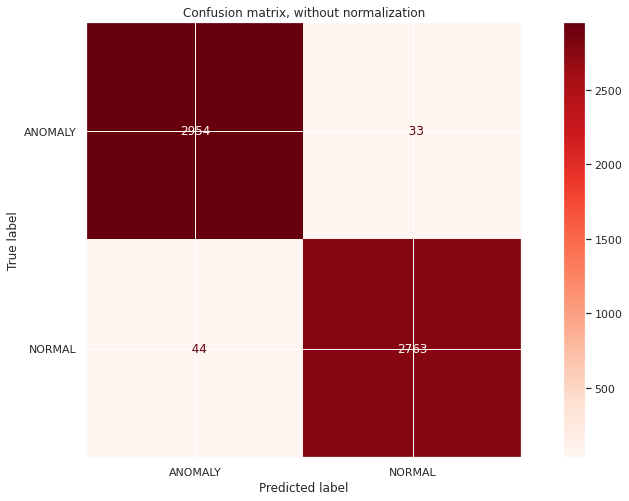

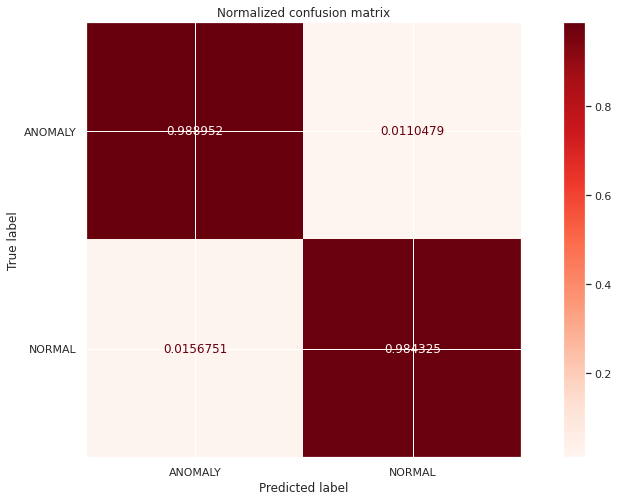

In [ ]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(log_regression_base, X_test, y_test,
                                 display_labels=['ANOMALY','NORMAL'],
                                 cmap=plt.cm.Reds,
                                 normalize=normalize,
                                 values_format='4g')
    disp.ax_.set_title(title)
    plt.gcf().set_size_inches(15,8)

plt.show()

# 5.0 Automatic feature engineering - time series

https://tsfresh.readthedocs.io/en/latest/text/introduction.html

https://techairesearch.com/time-series-feature-extraction-for-industrial-big-data-iiot-applications/

https://www.kaggle.com/superluminal098/tsfresh-features-and-regression-blend 

Prerequisitos:

- Colunas de variáveis **COM NENHUM DEFEITO DEFEITOS** (aplicação especifica)
- Colunas de variáveis COM DEFEITOS (pode ter algumas partes normais mas tem que ter defeito também)
- Criar coluna id (diferenciar equipamentos diferentes que medem as mesmas variáveis). No nosso caso, temos uma única bomba com diversos sensores, então so temos uma coluna id=1
- Criar coluna tempo 



Vou usar apenas a parte de criação de variáveis, mas tenha em monte que a engenharia de variaveis pode adotar as técnicas na documentação do site deles (média, minimo, maximo, FFT, media movel, etc...)

In [ ]:
aux=pd.concat([pd.DataFrame({'id': np.ones(Xnear_miss_2.shape[0])}, dtype=np.int64),
                   pd.DataFrame({'time': range(Xnear_miss_2.shape[0])}, dtype=np.int64)],axis=1)

aux.index = Xnear_miss_2.index

X_auto=pd.concat([aux,Xnear_miss_2],axis=1)

X_auto

,id,time,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49
0,1,0,0.000000,53.34201,52.821180,43.402775,202.526031,49.79289,3.219039,16.89091,16.869210,15.08247,35.53085,3.625588,1.602259,0.237091,407.4979,451.3286,449.1867,2.387357,652.2382,390.5987,858.3630,461.2751,955.7427,614.6786,653.9383,753.0676,570.8168,1161.1310,783.6125,710.6481,960.9374,742.2943,566.6204,261.7709,399.1291,301.1411,114.20790,52.08333,35.41666,87.23958,39.58333,36.979160,50.78125,50.92593,51.21528,50.63657,46.006940,409.14350,121.527800
1,1,1,0.000000,53.55902,52.777770,43.402775,204.725098,53.74214,3.045428,17.42621,15.740740,16.17477,40.31071,3.730241,1.612210,0.318798,404.9974,450.2004,454.0266,2.448104,651.1287,390.6628,857.0173,461.6187,951.3060,612.6481,652.3843,750.5814,550.9968,1118.1630,773.6210,704.6296,1003.1250,714.9668,548.0704,270.0769,403.3277,299.2007,110.52630,53.64583,35.41666,84.63541,40.62500,36.979164,49.47916,50.34722,51.21528,49.18982,49.479170,431.71300,133.101900
2,1,2,0.000000,53.55902,52.777770,43.402775,201.137131,52.49996,7.537616,13.53443,9.324364,16.05179,38.93098,3.816472,1.631223,0.342867,409.9810,447.9742,449.0287,2.410462,650.5953,390.4939,863.1273,458.5190,948.8156,615.3629,646.3538,749.3739,553.7806,1147.2190,783.5280,716.2037,1040.1040,740.6817,561.4838,265.9168,415.0607,305.2495,115.34480,55.20833,35.15625,81.25000,40.88541,36.979160,48.17708,49.76852,50.92593,48.03241,53.819440,451.38890,140.046300
3,1,3,0.000000,52.77777,52.690970,43.402770,204.030655,57.19875,7.609953,16.60880,16.203700,16.09520,33.43375,3.860711,1.622106,0.304665,412.2902,449.5466,453.7787,2.429593,652.1424,390.2556,857.9081,461.1630,950.7607,614.9879,649.2152,746.4882,541.1052,1131.8090,787.4129,678.2407,976.5624,719.6953,558.5663,266.8813,415.8537,306.2030,105.04380,57.03125,35.15625,79.16666,41.40625,36.718750,46.87500,48.03241,50.34722,47.45370,58.159720,466.43520,144.965300
4,1,4,0.000000,52.60416,52.734370,43.446180,203.567688,50.96181,7.573785,16.70284,16.160300,16.08796,33.13226,4.496508,1.650150,0.606178,408.3951,450.6098,444.7706,2.361692,652.0457,390.4180,858.0203,460.7399,949.6810,614.2903,649.3373,748.6567,546.8779,1148.8040,782.2913,682.4074,930.2083,723.4662,550.8478,263.7073,403.5153,303.2734,113.03400,57.55208,35.41666,75.26041,42.18750,36.718750,45.83333,47.45370,49.76852,46.58565,63.657410,474.82640,149.016200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28963,1,28963,2.507697,46.26736,53.645830,46.093750,636.689819,68.35252,14.677370,16.20370,15.653930,15.55266,46.54485,53.679000,35.176580,17.989310,417.5527,460.7025,466.9600,2.577515,665.2010,399.1738,880.1764,534.7722,1091.0850,629.4799,741.0898,983.4252,531.5056,992.8850,555.5580,746.2963,984.8958,990.5969,544.5608,345.1266,511.5123,802.3689,59.11361,52.34375,38.80208,87.76041,34.89583,36.197914,45.83333,52.37268,44.84954,49.76852,45.428242,280.38200,82.465280
28964,1,28964,2.459491,48.91493,54.036460,43.836803,639.236100,76.97380,13.599540,16.16753,15.292240,15.11863,46.15923,37.954410,32.459160,2.016063,429.7965,464.5719,503.7655,3.002387,665.6904,399.8904,875.6401,532.3793,979.2717,626.4971,749.4659,902.2071,453.0621,1153.3610,760.5096,646.2963,877.6041,926.9819,553.4322,151.5388,267.7331,857.2343,62.52839,47.39583,36.71875,58.85416,35.15625,36.718750,42.96875,39.06250,43.69213,46.58565,40.798610,109.95370,54.687500
28965,1,28965,1.992188,53.38541,47.960068,43.836803,574.5370

In [ ]:
#from tsfresh.examples.robot_execution_failures import download_robot_execution_failures, \
#    load_robot_execution_failures
#download_robot_execution_failures()
#timeseries, y = load_robot_execution_failures()

In [ ]:
#from tsfresh import extract_features
#xtracted_features = extract_features(X_auto, column_id="id", column_sort="time")

Demora muito também....

# 5.0 Automatic feature engineering - geral

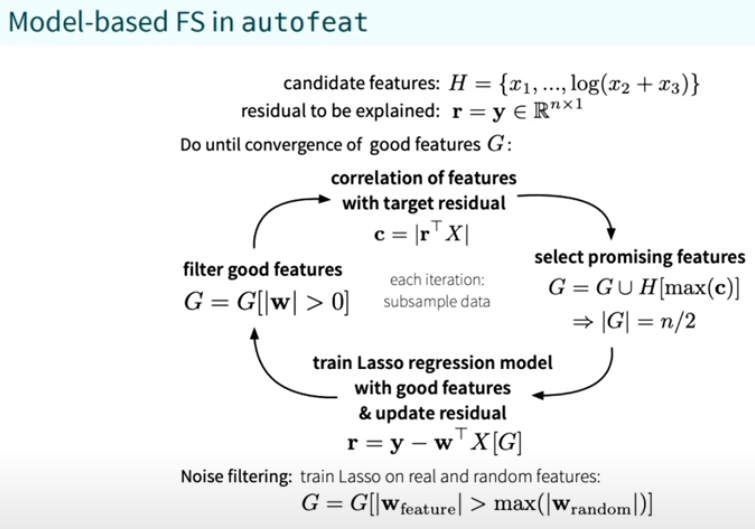

Additional non-linear features are generated in an alternating multi-step process by applying user selectable non-linear transformations to the features (e.g.
log(x), √x, 1/x, x2, x3, |x|, exp(x), 2x, sin(x), cos(x)) and combining pairs
of features with different operators (+, −, ·).

The heart of our feature selection algorithm. Given the feature matrix X with
all candidate features H, the aim is to select a few informative features (G) that
explain the target variable y. The set of good features G is adapted until a stable
set of features is reached. First, promising features are identified by computing the
correlation between the features and the target residual, and G is extended by those
features with the largest absolute correlation until G contains up to n/2 features (to
guarantee numerical stability in the following regression step). Next, the currently
selected good features are used to train a Lasso LARS regression model, based on
which the target residual is updated and the good features are filtered by retaining
only those with a non-zero regression weight.

https://www.youtube.com/watch?v=4-4pKPv9lJ4&ab_channel=PyData 

In [ ]:
from autofeat import FeatureSelector, AutoFeatClassifier

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(Xnear_miss_2, Ynear_miss_2, test_size=0.2, random_state=1)

In [ ]:
#t1 = time.time()

#for steps in range(3):
#    print("### AutoFeat with %i feateng_steps" % steps)
#    afreg = AutoFeatClassifier(verbose=1, feateng_steps=steps)

#    X_train_tr = afreg.fit_transform(X_train, y_train)
#    X_test_tr =  afreg.transform(X_test)
#    print("autofeat new features:", len(afreg.new_feat_cols_))
#    print("autofeat Acc. on training data:", accuracy_score(y_train, afreg.predict(X_train_tr)))
#    print("autofeat Acc. on test data:", accuracy_score(y_test, afreg.predict(X_test_tr)))

#    t2 = time.time() - t1    

#    print(t2)
#    print()



# Demora 3 h para a primeira iteração com 200000 linhas - Difícil se temos muitos dados
# Demora para a primeira iteracao com 20000 linhas

### AutoFeat with 0 feateng_steps


- [AutoFeat] The 0 step feature engineering process could generate up to 24 features.
-[AutoFeat] With 176256 data points this new feature matrix would use about 0.02 gb of space.
-[feateng] Warning: no features generated for max_steps < 1.
-[featsel] Scaling data...done.
-[featsel] Feature selection run 1/5
-[featsel] Feature selection run 2/5
-[featsel] Feature selection run 3/5
-[featsel] Feature selection run 4/5
-[featsel] Feature selection run 5/5
-[featsel] 17 features after 5 feature selection runs
-[featsel] 17 features after correlation filtering
-[featsel] 15 features after noise filtering
-[AutoFeat] Final dataframe with 24 feature columns (0 new).
-[AutoFeat] Training final classification model.
-[AutoFeat] Trained model: largest coefficients:
-[-0.36429359]
-3.965443 * sensor_00
-0.399922 * sensor_01
-0.358138 * sensor_13
-0.247009 * sensor_02
-0.132525 * sensor_09
-0.044763 * sensor_46
-0.034826 * sensor_06
-0.028470 * sensor_14
-0.028228 * sensor_43
-0.019845 * sensor_05
-0.014707 * sensor_34
-0.005612 * sensor_48
-0.004484 * sensor_37
-0.004451 * sensor_36
-0.004188 * sensor_27
-[AutoFeat] Final score: 0.9915
-autofeat new features: 0
-autofeat Acc. on training data: 0.9914839778503994
-autofeat Acc. on test data: 0.9921704793028322
-Tempo para rodar = 2.84 horas

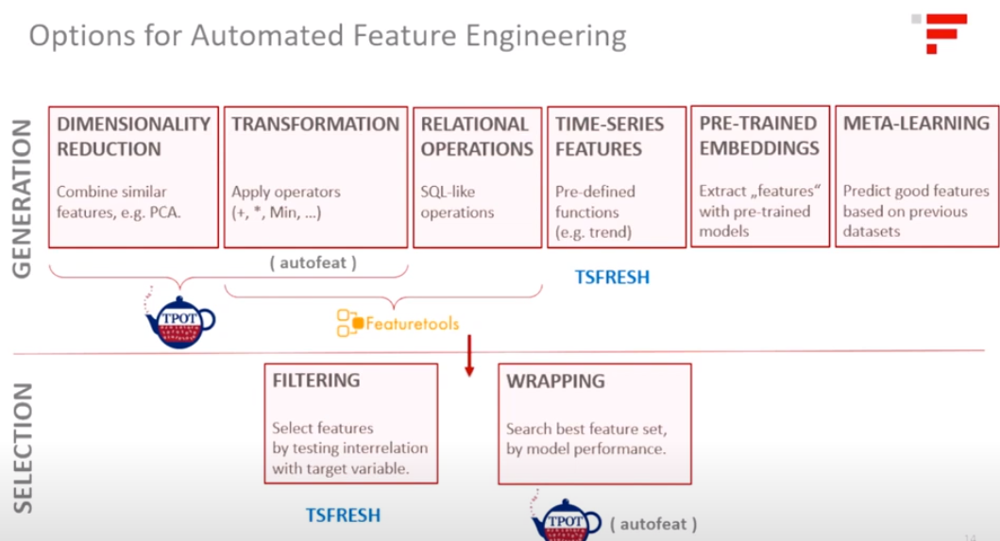

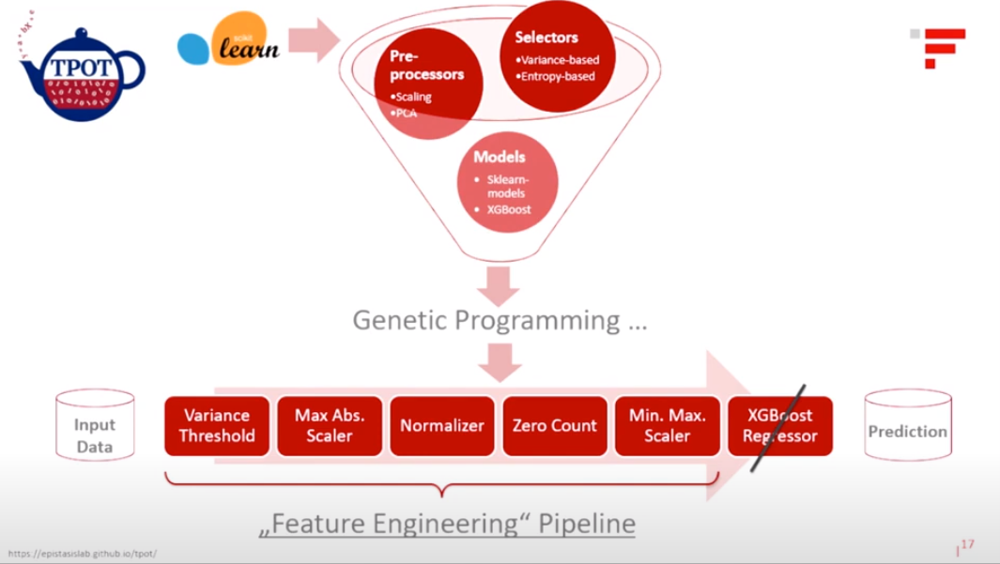

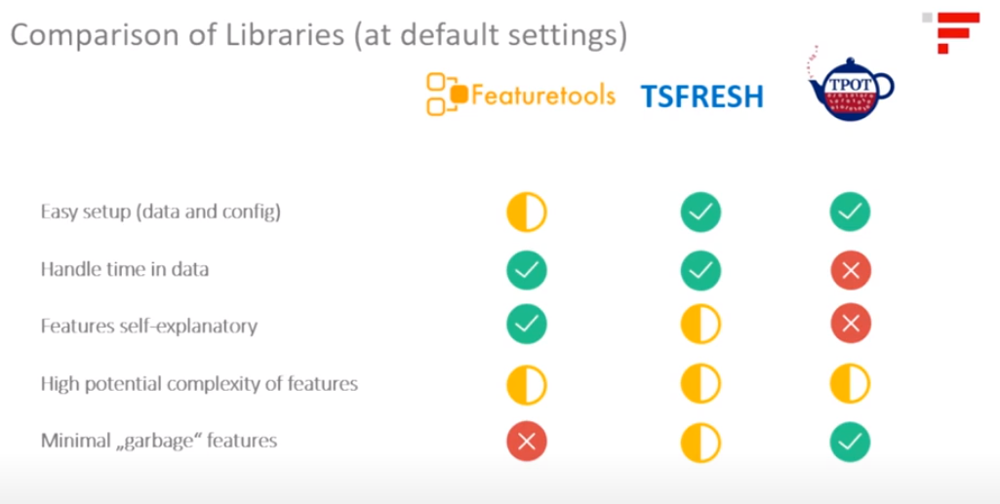

https://www.youtube.com/watch?v=XK7mKGWSue8&ab_channel=PyData

# Extra: anomalia não supervisionado

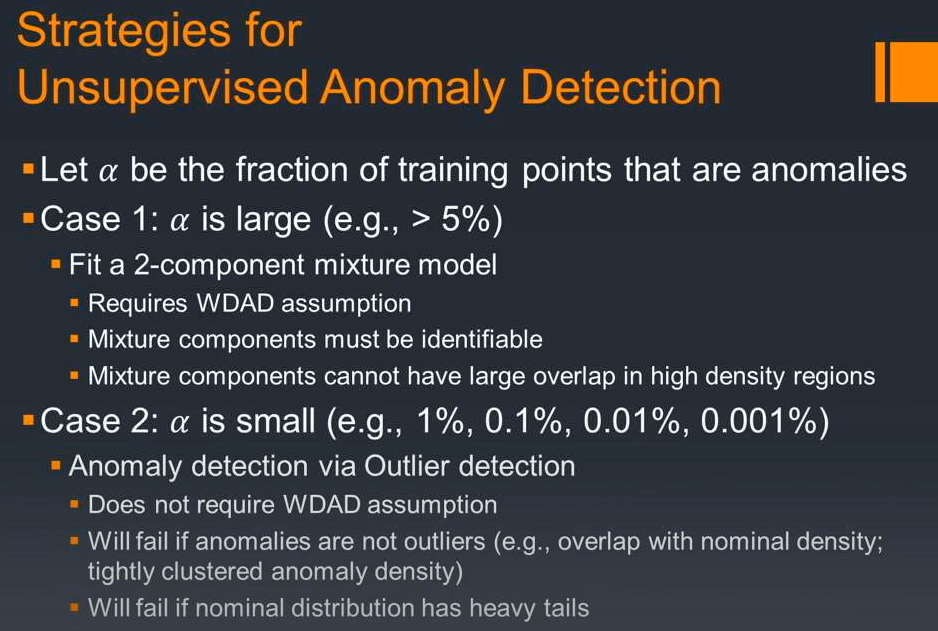

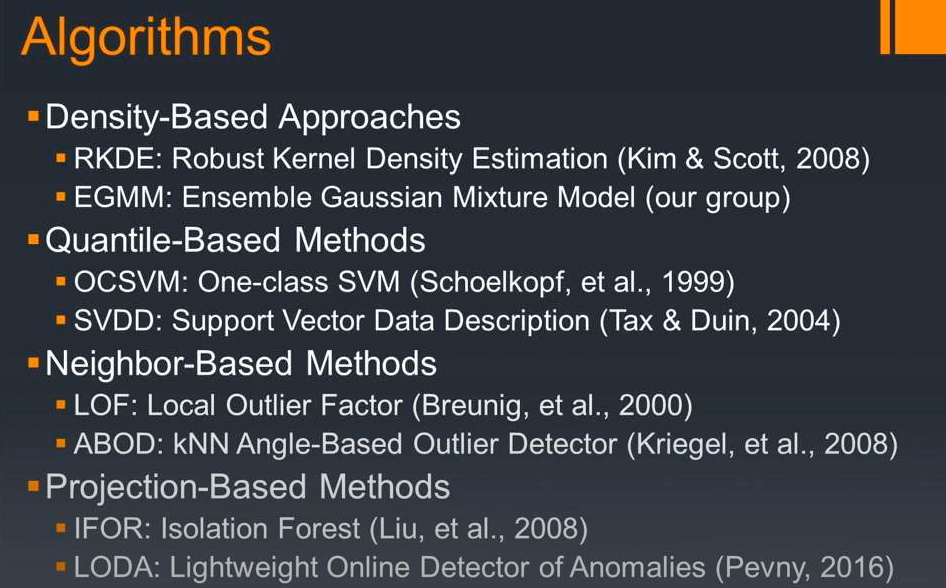

One of the most important assumptions for an unsupervised anomaly detection algorithm is that the dataset used for the learning purpose is assumed to have all non-anomalous training examples (or very very small fraction of anomalous examples). This might seem a very bold assumption but we just discussed in the previous section how less probable (but highly dangerous) an anomalous activity is. Also, the goal of the anomaly detection algorithm through the data fed to it is to learn the patterns of a normal activity so that when an anomalous activity occurs, we can flag it through the inclusion-exclusion principle. 

https://towardsdatascience.com/unsupervised-learning-for-anomaly-detection-44c55a96b8c1 

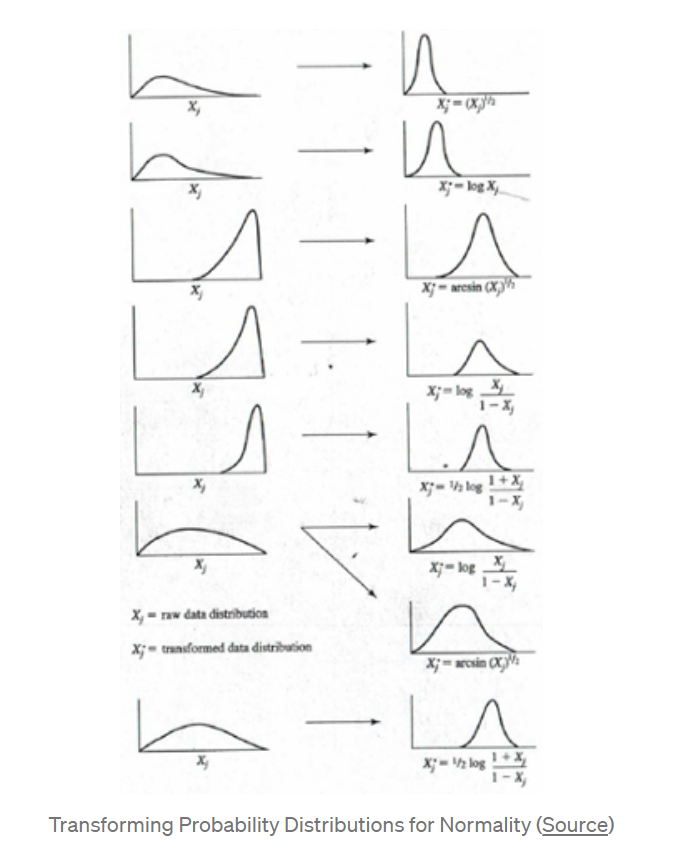

we cannot flag a data point as an anomaly based on a single feature. Only when a combination of all the probability values for all features for a given data point is calculated can we say with high confidence whether a data point is an anomaly or not.

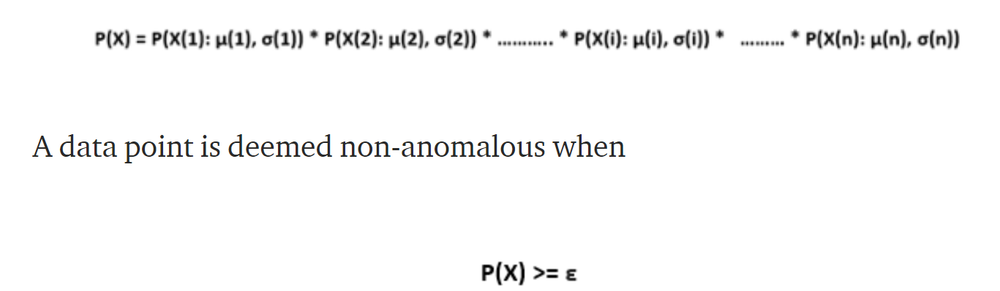